# NEIGHBOURHOOD CULTURAL OPPORTUNITIES INDEX

## Capstone Project - The Battle of the Neighborhoods (Week 2)



### Introduction: Business Problem

In 2005 by Toronto City Council addopted Toronto Strong Neighbourhoods Strategy (TSNS) 2020. The City uses 140 social planning neighbourhoods for designing programs and services. 

The scope of this report is to help to identify neighborhoods with lowest rating of cultural attractions and to recommend a list of these Priority Neighbourhood Areas for Investment (PNIs).

The rating of the neighborhoods will be based on number of venues in the neighborhoods per capita, as well as the popularity of venues, according to data on Foursquare.

We will use our data science powers to generate a list of neighborhoods recommended for investment, based on index. Type of venue for investment in  each area will then be clearly expressed so that best possible decission can be chosen by stakeholders (Toronto City Council).


### Data

Based on definition of our problem, factors that will influence the recommendation are:

#### List of Neighbourhoods

Neighbourhood refers to the City of Toronto's 140 social planning neighbourhoods. The boundaries of these social planning neighbourhoods are described in GEOJson format and can be uploaded at

https://open.toronto.ca/dataset/neighbourhoods/

Data are located also at 
https://github.com/AnatolPoiata/Capstone-Report/blob/master/Neighbourhoods.geojson

#### Neighbourhoods Profile

In these profiles, "neighbourhood" refers to the City of Toronto's 140 social planning neighbourhoods. The boundaries of these social planning neighbourhoods are consistent over time, allowing for comparison between Census years. We will use the most recent data which refer to 2016, limited to census data . As we will use index calculated as number of objects per capita, only data regarding population  will be used.
Data can be uploaded at 
https://open.toronto.ca/dataset/neighbourhood-profiles/

Data in .csv format  are located also at 
https://github.com/AnatolPoiata/Capstone-Report/blob/master/neighbourhood-profiles-2016-csv.csv

Neighbourhoods from mentioned above databases can be linked by common key Neighbourhood Number

#### Attractions

The data for attractions will be used from Foursquare API. As we are interested in cultural attractions we will use only 3 categories of venues 
- Arts & Entertainment
- Event
- Outdoor & Recreation

 and 50 subcategories

For each neigbourhood will be identify the list of attractions from Foursquare, located in this neighbourhood, as well as the rating of the venue.

### Import necessary Libraries

In [1]:
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner import pandas as pd # library for data analysis
import json # library to handle JSON files
import urllib

import requests # library to handle requests

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.path as mpltPath
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.10.0 --yes
import folium # map rendering library import matplotlib.pyplot as plt print('Libraries imported.')

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Libraries imported.


### Read Data

####  List of neighbourhoods

Source - https://open.toronto.ca/dataset

In [2]:
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson&projection=4326"

results = requests.get(url).json()

df = json_normalize(results["features"])
df.drop(['properties.AREA_SHORT_CODE','properties.X','properties.Y','type','properties.OBJECTID','properties.PARENT_AREA_ID','properties.Shape__Area','properties.Shape__Length','properties._id', 'properties.AREA_DESC'],axis=1,inplace=True)
df.rename(columns={'properties.AREA_ATTR_ID':'AREA_ATTR_ID','properties.AREA_ID':'AREA_ID','properties.AREA_LONG_CODE':'Neighbourhood ID' }, inplace=True)
df.rename(columns={'properties.AREA_NAME':'AREA_NAME','properties.LATITUDE':'LATITUDE','properties.LONGITUDE':'LONGITUDE'}, inplace=True)
df[['Neighbourhood ID']]=df[['Neighbourhood ID']].astype('float')
df.head()


,geometry.coordinates,geometry.type,AREA_ATTR_ID,AREA_ID,Neighbourhood ID,AREA_NAME,LATITUDE,LONGITUDE
0,"[[[-79.43591570873059, 43.68015339477487], [-7...",Polygon,25926662,25886861,94.0,Wychwood (94),43.676919,-79.425515
1,"[[[-79.41095783825973, 43.704082823014815], [-...",Polygon,25926663,25886820,100.0,Yonge-Eglinton (100),43.704689,-79.403590
2,"[[[-79.39119482591805, 43.68108112277795], [-7...",Polygon,25926664,25886834,97.0,Yonge-St.Clair (97),43.687859,-79.397871
3,"[[[-79.50528791818931, 43.759873498780955], [-...",Polygon,25926665,25886593,27.0,York University Heights (27),43.765736,-79.488883
4,"[[[-79.4396873322608, 43.70560981891119], [-79...",Polygon,25926666,25886688,31.0,Yorkdale-Glen Park (31),43.714672,-79.457108


read data from Neighbourhood Profile file

In [3]:
url="https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/ef0239b1-832b-4d0b-a1f3-4153e53b189e"
np = pd.read_csv(url,nrows=2, skiprows = [2]) 
np.head()

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,3,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2016","2,731,571","29,113","23,757","12,054","30,526",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"


In [4]:
np.drop(['_id','Category','Topic','Data Source','Characteristic','City of Toronto'],axis=1,inplace=True)
n_profile=np.transpose()
n_profile.rename(columns={0: "Neighbourhood ID", 1:"Population"},inplace=True)
n_profile.head()

,Neighbourhood ID,Population
Agincourt North,129,"29,113"
Agincourt South-Malvern West,128,"23,757"
Alderwood,20,"12,054"
Annex,95,"30,526"
Banbury-Don Mills,42,"27,695"


In [5]:
n_profile["Neigbbour Name"] = pd.Series()
n_profile["Neigbbour Name"] = list(n_profile.index)

In [6]:
n_profile['Neighbourhood ID']=pd.to_numeric(n_profile['Neighbourhood ID'], errors='coerce')

In [7]:
neighbourhoods=pd.merge(df[['geometry.coordinates','Neighbourhood ID','LATITUDE','LONGITUDE']],n_profile,on='Neighbourhood ID')

In [8]:
neighbourhoods.head()

,geometry.coordinates,Neighbourhood ID,LATITUDE,LONGITUDE,Population,Neigbbour Name
0,"[[[-79.43591570873059, 43.68015339477487], [-7...",94.0,43.676919,-79.425515,"14,349",Wychwood
1,"[[[-79.41095783825973, 43.704082823014815], [-...",100.0,43.704689,-79.403590,"11,817",Yonge-Eglinton
2,"[[[-79.39119482591805, 43.68108112277795], [-7...",97.0,43.687859,-79.397871,"12,528",Yonge-St.Clair
3,"[[[-79.50528791818931, 43.759873498780955], [-...",27.0,43.765736,-79.488883,"27,593",York University Heights
4,"[[[-79.4396873322608, 43.70560981891119], [-79...",31.0,43.714672,-79.457108,"14,804",Yorkdale-Glen Park


#### Define Foursquare Credentials and Version

In [9]:
CLIENT_ID = '04IDQVEWN2EKWAJWYWSJCNF5TLCXLLQP3TEZE3O3UXLCWYWO' # Foursquare ID
CLIENT_SECRET = 'TMDKCKXITJXUFOSNQKA1NUORHUC5HCQYGRUM12BKA5F5RXIR' # Foursquare Secret
VERSION = '20180604'
LIMIT = 50
radius = 1500
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Toronto_geo = [43.72,-79.31]

Your credentails:
CLIENT_ID: 04IDQVEWN2EKWAJWYWSJCNF5TLCXLLQP3TEZE3O3UXLCWYWO
CLIENT_SECRET:TMDKCKXITJXUFOSNQKA1NUORHUC5HCQYGRUM12BKA5F5RXIR


#### Import venues from Foursquare, corresponding to the list of categories, associated with Arts&Culture

In [10]:
#all_venues = None
# 4d4b7104d754a06370d81259  - Arts & Entertainment
# 4d4b7105d754a06373d81259 -  Event
# 4d4b7105d754a06377d81259 - Outdoors & Recreation

cat_list=['4d4b7104d754a06370d81259','4d4b7105d754a06373d81259','4d4b7105d754a06377d81259']
index=0

for categories in cat_list:
    for j, row in neighbourhoods.iterrows():
        latitude = row['LATITUDE']
        longitude = row['LONGITUDE']
        url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, categories, radius, LIMIT)
        results = requests.get(url).json()
        venue = results['response']['venues']
        neighbourhood_venues = json_normalize(venue)
        neighbourhood_venues["catId"] = pd.Series()
        neighbourhood_venues["catId"] = categories    
        if index==0:
            all_venues = neighbourhood_venues
            index = 1
        else:
            all_venues = all_venues.append(neighbourhood_venues,ignore_index=True, sort=False)
        
print('Total venues: ', all_venues.shape)
all_venues.sort_values("id", inplace=True)
all_venues.drop_duplicates(subset ="id", keep = False, inplace = True) 
all_venues.reset_index(drop=True,inplace=True)    
print('Total unique venues: ', all_venues.shape)

Total venues:  (9329, 22)
Total unique venues:  (1799, 22)


In [11]:
all_venues.head(10)

,categories,hasPerk,id,location.address,location.cc,location.city,location.country,location.crossStreet,location.distance,location.formattedAddress,...,location.lng,location.neighborhood,location.postalCode,location.state,name,referralId,venuePage.id,catId,events.count,events.summary
0,"[{'id': '4bf58dd8d48988d1f2931735', 'name': 'P...",False,4ad4c05ef964a52094f620e3,235 Queens Quay West,CA,Toronto,Canada,at Lower Simcoe St.,709.0,"[235 Queens Quay West (at Lower Simcoe St.), T...",...,-79.383190,NaN,M5J 2G8,ON,Harbourfront Centre,v-1568539536,37512083,4d4b7104d754a06370d81259,NaN,NaN
1,"[{'id': '4deefb944765f83613cdba6e', 'name': 'H...",False,4ad4c05ef964a52098f620e3,1000 Murray Ross Pkwy.,CA,Toronto,Canada,NaN,1027.0,"[1000 Murray Ross Pkwy., Toronto ON M3J 3P1, C...",...,-79.516991,NaN,M3J 3P1,ON,Black Creek Pioneer Village,v-1568539547,NaN,4d4b7104d754a06370d81259,NaN,NaN
2,"[{'id': '4bf58dd8d48988d163941735', 'name': 'P...",False,4ad4c05ef964a5209af620e3,Toronto Islands,CA,Toronto,Canada,NaN,1314.0,"[Toronto Islands, Toronto ON M5J 2N8, Canada]",...,-79.378495,NaN,M5J 2N8,ON,Toronto Islands,v-1568539658,NaN,4d4b7105d754a06377d81259,NaN,NaN
3,"[{'id': '4bf58dd8d48988d1e2931735', 'name': 'A...",False,4ad4c05ef964a520e0f620e3,115 King Street East,CA,Toronto,Canada,NaN,1547.0,"[115 King Street East, Toronto ON M5C 1G6, Can...",...,-79.373715,NaN,M5C 1G6,ON,Toronto Sculpture Garden,v-1568539525,NaN,4d4b7104d754a06370d81259,NaN,NaN
4,"[{'id': '4bf58dd8d48988d190941735', 'name': 'H...",False,4ad4c05ef964a520e1f620e3,1007 Brimley Road,CA,Toronto,Canada,NaN,351.0,"[1007 Brimley Road, Toronto ON M1P 3E8, Canada]",...,-79.254633,NaN,M1P 3E8,ON,Scarborough Historical Museum,v-1568539546,NaN,4d4b7104d754a06370d81259,NaN,NaN
5,"[{'id': '4bf58dd8d48988d1e2931735', 'name': 'A...",False,4ad4c05ef964a520e8f620e3,110 Yorkville Avenue,CA,Toronto,Canada,NaN,1613.0,"[110 Yorkville Avenue, Toronto ON M5R 1B9, Can...",...,-79.391294,NaN,M5R 1B9,ON,Hollander York Gallery,v-1568539527,NaN,4d4b7104d754a06370d81259,NaN,NaN
6,"[{'id': '4bf58dd8d48988d1e2931735', 'name': 'A...",False,4ad4c05ff964a52000f720e3,594B Dundas St W,CA,Toronto,Canada,at Augusta,1600.0,"[594B Dundas St W (at Augusta), Toronto ON M5T...",...,-79.400826,NaN,M5T 1H5,ON,Whippersnapper Gallery,v-1568539523,NaN,4d4b7104d754a06370d81259,NaN,NaN
7,"[{'id': '4bf58dd8d48988d1e2931735', 'name': 'A...",False,4ad4c05ff964a520edf620e3,231 Queens Quay West,CA,Toronto,Canada,NaN,622.0,"[231 Queens Quay West, Toronto ON M5J 2G8, Can...",...,-79.381994,NaN,M5J 2G8,ON,The Power Plant,v-1568539535,NaN,4d4b7104d754a06370d81259,NaN,NaN
8,"[{'id': '5032792091d4c4b30a586d5c', 'name': 'C...",False,4ad4c062f964a520bcf720e3,145 Wellington St. W.,CA,Toronto,Canada,Simcoe St.,1487.0,"[145 Wellington St. W. (Simcoe St.), Toronto O...",...,-79.385018,NaN,M5J 1H8,ON,Toronto Symphony Orchestra,v-1568539536,33864018,4d4b7104d754a06370d81259,NaN,NaN
9,"[{'id': '5032792091d4c4b30a586d5c', 'name': 'C...",False,4ad4c062f964a520bdf720e3,250 Front Street West,CA,Toronto,Canada,NaN,1444.0,"[250 Front Street West, Toronto ON M5V 3G5, Ca...",...,-79.387990,NaN,M5V 3G5,ON,Glenn Gould Studio,v-1568539535,NaN,4d4b7104d754a06370d81259,NaN,NaN


In [12]:
nb_venues=all_venues.copy()

In [13]:
nb_venues["Neighbourhood ID"] = pd.Series()

In [14]:
def Reverse(lst):
    for il in range(len(lst)):        
        lst[il].reverse()
    return lst    

#### Associate venue with neighbour

In [15]:
# Check if venue is inside the neighbourhood

for j, nbrow in neighbourhoods.iterrows():
    polygon=nbrow["geometry.coordinates"][0]
    path = mpltPath.Path(polygon)

    for index, row in nb_venues.iterrows():
        point=[[row['location.lng'], row['location.lat']]]    
        
        if path.contains_points(point):
            nb_venues.at[index, 'Neighbourhood ID'] = nbrow['Neighbourhood ID']


In [16]:
# Total number of venues
nb_venues.shape

(1799, 23)

In [17]:
# exclude rows with NaN values in 'Neighbourhood ID' - venues wich are not placed in Neighbourhoods 
nb_venues.dropna(subset=['Neighbourhood ID'], axis=0, inplace=True)

In [18]:
nb_venues.reset_index(drop=True, inplace=True)

In [19]:
nb_venues.shape

(1709, 23)

In [20]:
def color_venue(vnn):
    if vnn == '4d4b7104d754a06370d81259':  ## Arts & Entertainment
        return 'red'
    elif vnn =='4d4b7105d754a06373d81259': # Event
        return 'yellow'
    else: return 'green'  #Outdoors & Recreation

#### Plot the map of neighbourhoods

In [21]:
# Plot the map of neighbourhoods
# It'a problem to show map in Google Chrome browser. For Safari/Mozila it's ok

neighbours_edge = f'Neighbourhoods.geojson'

map1 = folium.Map(
    location=Toronto_geo,
    titles='Toronto Neighbourhoods',
    zoom_start=11  # Limited levels of zoom for free Mapbox tiles.
)

folium.features.GeoJson(
    neighbours_edge,
    name='geojson'
).add_to(map1)
map1

#### Add venues to map

In [22]:
# Add venues to map
# It'a problem to show map in Google Chrome browser. For Safari/Mozila it's ok

fgv = folium.FeatureGroup(name="Venues")
for index, row in nb_venues.iterrows():
    
    fgv.add_child(folium.vector_layers.CircleMarker(
        location = [ row['location.lat'], row['location.lng'] ],
        radius=4, color='blue',
        fill = True, fill_color=color_venue(row['catId']), fill_opacity=0.6, weight=1
        ))

map1.add_child(fgv)

map1.add_child(folium.LayerControl())

#### Count and group venues for each neighbour

In [24]:
# count and group venues for each neighbour 
n_group=nb_venues.groupby('Neighbourhood ID')['id'].count()


In [25]:
neighbour_group=pd.merge(n_group,neighbourhoods,on='Neighbourhood ID',how='right')


In [26]:
import numpy as np 
neighbour_group['id'].replace(np.nan,0,inplace=True)

In [27]:
# change data formar - exlude ',' and convert to float
neighbour_group['Population'] = neighbour_group['Population'].str.replace(",","").astype(float)

#### Calculate venues per capita

In [28]:
#calculate venues per capita and add to dataframe as new column
neighbour_group['Venues_per_capita']=neighbour_group['id']/neighbour_group['Population']
neighbour_group=neighbour_group.sort_values('Venues_per_capita', ascending=False)

#### Plot a box plot with statistic represention of the the distribution of the data through five main dimensions :

  * Minimun: Smallest number in the dataset.
  * First quartile: Middle number between the minimum and the median.
  * Second quartile (Median): Middle number of the (sorted) dataset.
  * Third quartile: Middle number between median and maximum.
  * Maximum: Highest number in the dataset.

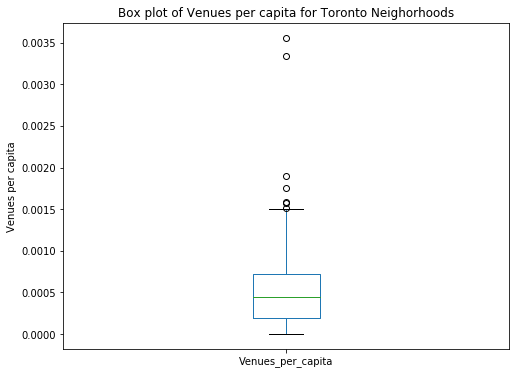

In [70]:
bar_group=neighbour_group[['Venues_per_capita']]
 
bar_group.plot(kind='box', figsize=(8, 6))
 
plt.title('Box plot of Venues per capita for Toronto Neighorhoods')
plt.ylabel('Venues per capita')
 
plt.show()

#### Plot histograme for distribuition of number of venues per capita for neighbourhoods

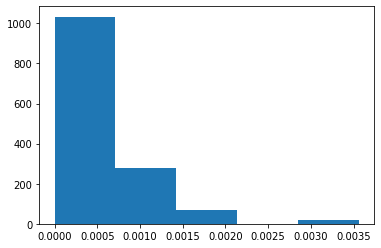

In [71]:
# Plot histograme for distribuition of number of venues per capita for neighbourhoods
x = neighbour_group['Venues_per_capita']
plt.hist(x, density=True, bins=5)
plt.show()

In [31]:
# group number of venues per capita by Neighbourhood ID and Category of the venue
neighbour_group_cat=nb_venues.groupby(['Neighbourhood ID','catId'], as_index=False)['id'].count()

#### Plot distribution of venues per capita ie each selected category for each Neighbourhood

Use scatter plot to compare venues per capita ie each selected category

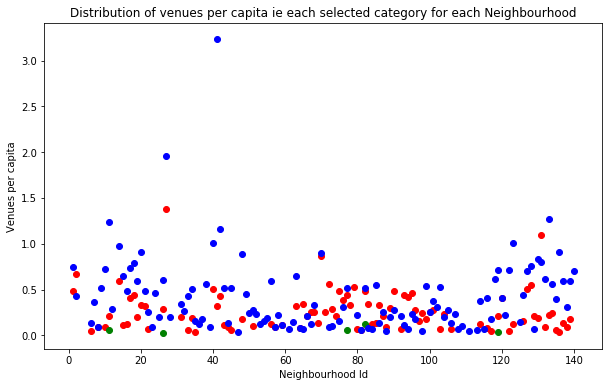

In [73]:
# plot distribution of venues per capita ie each selected category for each Neighbourhood

clr=['r','g','b']
iclr=0

plt.figure(figsize=(10, 6))
# Generate plot1

for category in cat_list:
    group_cat=neighbour_group_cat[neighbour_group_cat['catId']==category]
    group_cat=pd.merge(group_cat,n_profile,on='Neighbourhood ID')
    group_cat['Population'] = group_cat['Population'].str.replace(",","").astype(float)
    group_cat['Venues_per_capita']=group_cat['id']/group_cat['Population']*1000
    x=group_cat['Neighbourhood ID']
    y=group_cat['Venues_per_capita']
    plt.scatter(x,y,label='',color=clr[iclr])
    iclr=iclr+1

# Show the plot in non-blocking mode
plt.title('Distribution of venues per capita ie each selected category for each Neighbourhood')
plt.xlabel('Neighbourhood Id')
plt.ylabel('Venues per capita')
plt.show(block=False)

#### Determine the optimal number of clusters by Elbow Method For Optimal k

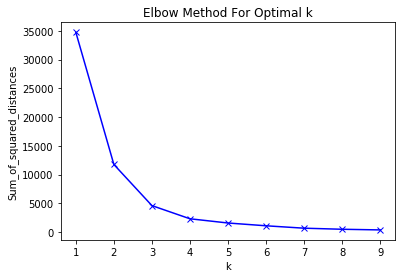

In [33]:
neighbour_group_clustering = neighbour_group[['id','Venues_per_capita']]

Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(neighbour_group_clustering)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [34]:
# set number of clusters
kclusters = 4

#neighbour_group_clustering = neighbour_group.drop(['Neighbourhood ID','Neigbbour Name','geometry.coordinates','LATITUDE','LONGITUDE','Population'], 1)
neighbour_group_clustering = neighbour_group[['id','Venues_per_capita']]

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(neighbour_group_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_ 

array([2, 1, 1, 2, 2, 1, 2, 2, 3, 2, 3, 2, 3, 2, 2, 3, 2, 2, 3, 1, 2, 3,
       2, 2, 2, 3, 0, 3, 3, 0, 3, 3, 3, 0, 2, 3, 3, 2, 0, 3, 3, 3, 3, 0,
       0, 3, 3, 3, 3, 3, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3,
       3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [35]:
# add clustering labels
neighbour_group.insert(0, 'Cluster Labels', kmeans.labels_)
neighbour_group.head()

,Cluster Labels,Neighbourhood ID,id,geometry.coordinates,LATITUDE,LONGITUDE,Population,Neigbbour Name,Venues_per_capita
34,2,41.0,33.0,"[[[-79.39007651184855, 43.727682165724666], [-...",43.731013,-79.378904,9266.0,Bridle Path-Sunnybrook-York Mills,0.003561
22,1,27.0,92.0,"[[[-79.50528791818931, 43.759873498780955], [-...",43.765736,-79.488883,27593.0,York University Heights,0.003334
118,1,131.0,88.0,"[[[-79.19701005996852, 43.79652190577172], [-7...",43.821201,-79.186343,46496.0,Rouge,0.001893
61,2,70.0,49.0,"[[[-79.3286848763479, 43.64745219902851], [-79...",43.649292,-79.335651,27876.0,South Riverdale,0.001758
35,2,42.0,44.0,"[[[-79.33055472634429, 43.73978987881326], [-7...",43.737657,-79.349718,27695.0,Banbury-Don Mills,0.001589


In [36]:
cluster_value=neighbour_group.groupby('Cluster Labels').mean()
cluster_value=cluster_value.sort_values(by=['Venues_per_capita'])
cluster_value

,Neighbourhood ID,id,LATITUDE,LONGITUDE,Population,Venues_per_capita
Cluster Labels,,,,,,
0,66.920455,3.875000,43.702066,-79.416279,15120.909091,0.000270
3,80.354839,15.193548,43.714976,-79.369767,23109.290323,0.000732
2,73.000000,34.176471,43.731609,-79.372639,29445.647059,0.001313
1,62.250000,79.000000,43.713570,-79.398936,45991.750000,0.001953


In [37]:
cl=list(cluster_value.index.values)

#### Create map with clusters

In [41]:
# create map
# It'a problem to show map in Google Chrome browser. For Safari/Mozila it's ok

map_clusters = folium.Map(location=Toronto_geo, zoom_start=11)
clt = folium.FeatureGroup(name="Clusters")
#colors_array = cm.rainbow(np.linspace(0, 1, kclusters))
#rainbow = [colors.rgb2hex(i) for i in colors_array]
colors=['red','yellow','blue','green']

for i in range(0, kclusters):
     
#    print(cluster_value.iloc[i,5])    
    for j, nbrow in neighbour_group.iterrows():
        
        if (nbrow['Cluster Labels']==cl[i]):
            polygon=Reverse(nbrow["geometry.coordinates"][0])
            clt.add_child(folium.vector_layers.Polygon(
                locations=polygon, 
                color='red',
                fill_color=colors[i],
                fill_opacity=0.3, weight=1))
map_clusters.add_child(clt)
map_clusters.add_child(folium.LayerControl())

In [62]:
# Add legend
# It'a problem to show map in Google Chrome browser. For Safari/Mozila it's ok

from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Cultural Opportunity Index</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:red;opacity:0.7;'></span>Very low - 0.000270</li>
    <li><span style='background:yellow;opacity:0.7;'></span>Low - 0.000732</li>
    <li><span style='background:blue;opacity:0.7;'></span>Intermediate - 0.001313</li>
    <li><span style='background:green;opacity:0.7;'></span>High  - 0.001953</li>

    

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

map_clusters.get_root().add_child(macro)

